In [2]:
NUM_CORES = 2
import argparse
import pandas as pd

import jax.numpy as jnp
import jax
import numpy as np
import matplotlib.pyplot as plt
from jax import grad, jit, vmap
import numpyro
from numpyro import distributions as dist
from numpyro import infer

from numpyro_ext import distributions as distx
import numpyro_ext.distributions, numpyro_ext.optim

import os
os.environ["XLA_FLAGS"] = f"--xla_force_host_platform_device_count={NUM_CORES}"

jax.config.update("jax_enable_x64", True)
numpyro.set_host_device_count(NUM_CORES)

from jaxoplanet import light_curves, orbits
from jaxoplanet.light_curves import limb_dark_light_curve
import arviz as az

from tinygp import GaussianProcess, kernels


from eclipsoid.legacy.light_curve import oblate_lightcurve_dict
import paths

oblate_lightcurve = jit(oblate_lightcurve_dict)

In [3]:
df = pd.read_csv(paths.data/'Sing_2024_Fig1_WASP107b_white_light_curve_data.csv')
t = jnp.array(df['bjd_tdb(days)'] - 2460118.948861)
nsr_1_f = jnp.array(df['NRS1_wlc_flux'])
nsr_1_f_err = jnp.array(df['NRS1_wlc_flux_err'])
nrs_2_f = jnp.array(df['NRS2_wlc_flux'])
nrs_2_f_err = jnp.array(df['NRS2_wlc_flux_err'])

In [4]:
inf_data = az.from_netcdf(paths.data/"wasp_107_circular_mcmc_jointfit_GP_posterior.h5")
az.summary(inf_data, var_names=['t0','r_circ', 'bo', 'u_nrs1','u_nrs2', 'duration', 
                                'nrs1_log_jitter', 'nrs2_log_jitter', 
                                "nrs1_log_ell", "nrs2_log_ell","nrs1_log_amp","nrs2_log_amp",])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
t0,0.000,0.000,0.000,0.000,0.000,0.000,6872.0,4195.0,1.0
r_circ,0.144,0.000,0.143,0.144,0.000,0.000,6355.0,5044.0,1.0
bo,0.092,0.019,0.053,0.124,0.000,0.000,4005.0,2303.0,1.0
u_nrs1[0],0.097,0.030,0.041,0.155,0.000,0.000,5168.0,2541.0,1.0
u_nrs1[1],0.230,0.041,0.152,0.306,0.001,0.000,5188.0,3416.0,1.0
u_nrs2[0],0.058,0.017,0.022,0.088,0.000,0.000,3800.0,1988.0,1.0
u_nrs2[1],0.186,0.027,0.135,0.237,0.000,0.000,3767.0,2618.0,1.0
duration,0.115,0.000,0.115,0.115,0.000,0.000,7474.0,4802.0,1.0
nrs1_log_jitter,-11.185,0.466,-12.067,-10.417,0.006,0.004,8044.0,4215.0,1.0
nrs2_log_jitter,-10.464,0.441,-11.295,-9.743,0.006,0.004,7089.0,4294.0,1.0


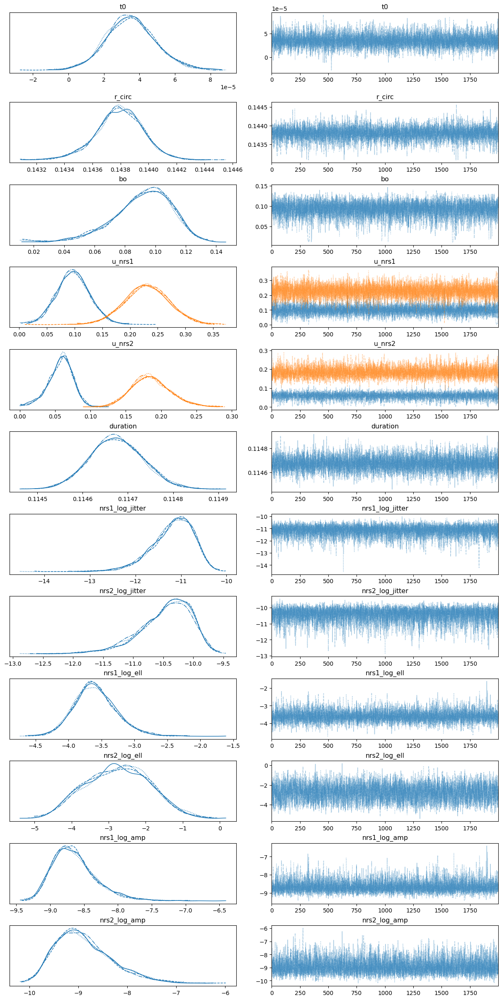

In [5]:
az.plot_trace(
    inf_data,
    var_names=['t0','r_circ', 'bo', 'u_nrs1','u_nrs2', 'duration', 
                                'nrs1_log_jitter', 'nrs2_log_jitter', 
                                "nrs1_log_ell", "nrs2_log_ell","nrs1_log_amp","nrs2_log_amp"],
    backend_kwargs={"constrained_layout": True},
);

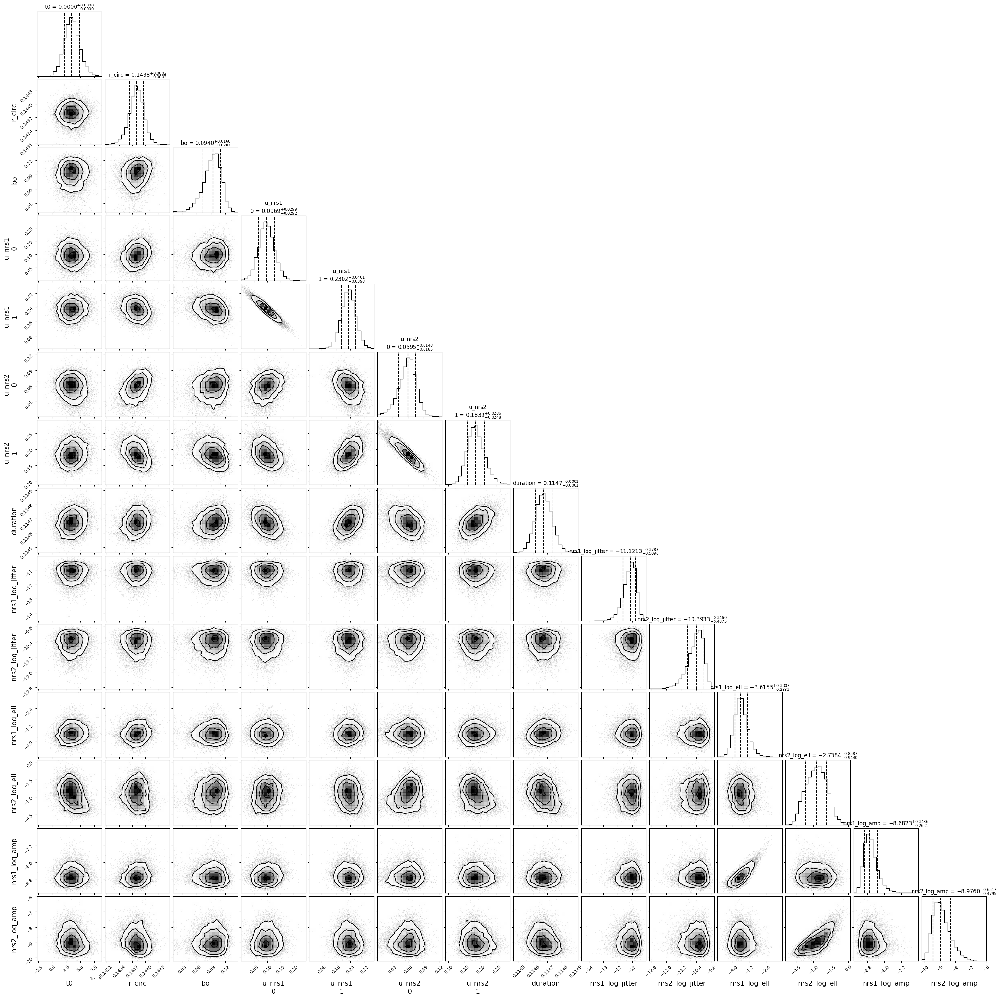

In [6]:
import corner
corner.corner(
    inf_data,
    var_names=['t0','r_circ', 'bo', 'u_nrs1','u_nrs2', 'duration', 
                                'nrs1_log_jitter', 'nrs2_log_jitter', 
                                "nrs1_log_ell", "nrs2_log_ell","nrs1_log_amp","nrs2_log_amp"],
    show_titles=True,
    quantiles=[0.16, 0.5, 0.84],
    title_kwargs={"fontsize": 12},
    label_kwargs={"fontsize": 15},
    title_fmt=".4f",
);

Text(0.5, 0.98, 'Circular GP model')

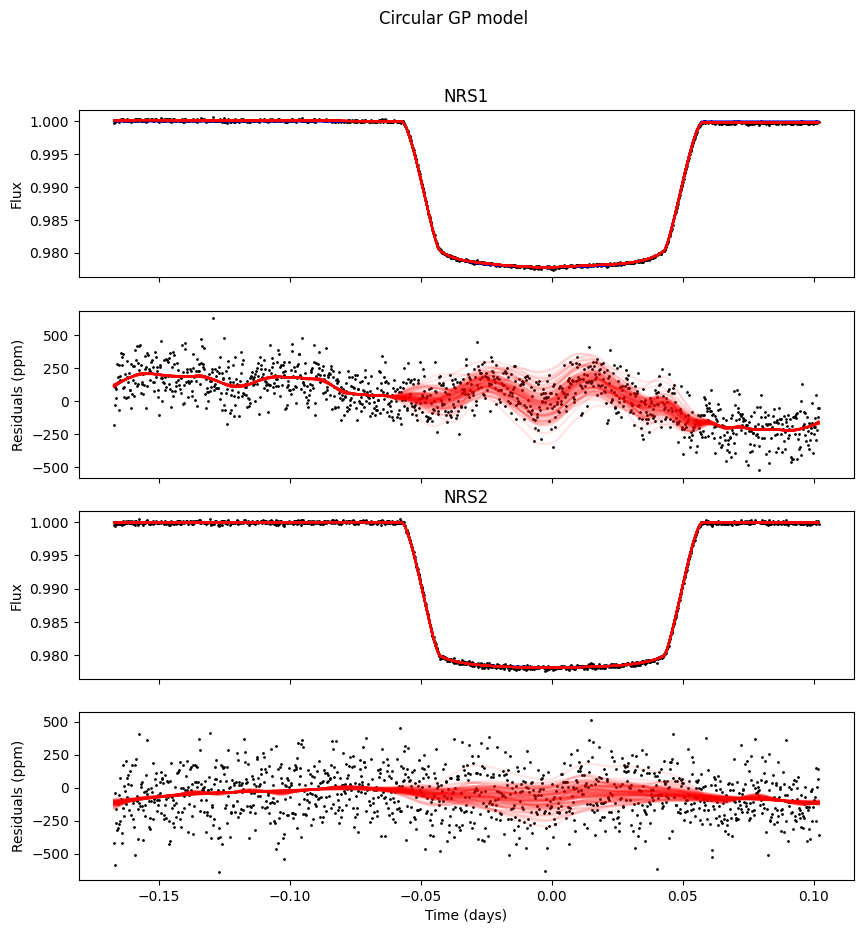

In [7]:
fig, (ax1, ax3, ax2, ax4) = plt.subplots(4,1,figsize=(10,10), sharex=True)

nrs1_mean_lc = inf_data.posterior["nrs1_light_curve"].mean(axis=(0,1)).to_numpy()
nrs1_mean_gp = inf_data.posterior["nrs1_gp"].mean(axis=(0,1)).to_numpy()

nrs2_mean_lc = inf_data.posterior["nrs2_light_curve"].mean(axis=(0,1)).to_numpy()
nrs2_mean_gp = inf_data.posterior["nrs2_gp"].mean(axis=(0,1)).to_numpy()

ax1.scatter(t,nsr_1_f,c='k',s=1)
ax2.scatter(t,nrs_2_f,c='k',s=1)
ax1.plot(t,nrs1_mean_lc,c='b', label="mean oblate transit model")
ax1.plot(t,nrs1_mean_gp+nrs1_mean_lc,c='r', label="GP")
ax1.set_title("NRS1")
ax2.plot(t,nrs2_mean_lc,c='b', label="mean oblate transit model")
ax2.plot(t,nrs2_mean_gp+nrs2_mean_lc,c='r', label="GP")
ax2.set_title("NRS2")
ax1.set_ylabel("Flux")
ax2.set_ylabel("Flux")
#plot residuals
ax3.scatter(t,1e6*(nsr_1_f-nrs1_mean_lc),c='k',s=1)
ax4.scatter(t,1e6*(nrs_2_f-nrs2_mean_lc),c='k',s=1)
#ax3.plot(t,1e6*nrs1_mean_gp,c='r')
#ax4.plot(t,1e6*nrs2_mean_gp,c='r')
ax3.set_ylabel("Residuals (ppm)")
ax4.set_ylabel("Residuals (ppm)")
ax4.set_xlabel("Time (days)")

#plot random draws from the posterior
np.random.seed(1)
inds = np.random.choice(inf_data.posterior.chain.size*inf_data.posterior.draw.size, 100)
inds_2d = np.unravel_index(inds, (inf_data.posterior.chain.size, inf_data.posterior.draw.size))
for i, j in zip(*inds_2d):
    ax1.plot(t,inf_data.posterior['nrs1_light_curve'].to_numpy()[i,j]+inf_data.posterior["nrs1_gp"].to_numpy()[i,j],c='r', alpha=0.1)
    ax2.plot(t,inf_data.posterior['nrs2_light_curve'].to_numpy()[i,j]+inf_data.posterior["nrs2_gp"].to_numpy()[i,j],c='r', alpha=0.1)
    
    ax3.plot(t,1e6*(inf_data.posterior["nrs1_gp"].to_numpy()[i,j]),c='r', alpha=0.1)
    ax4.plot(t,1e6*(inf_data.posterior["nrs2_gp"].to_numpy()[i,j]),c='r', alpha=0.1)
plt.suptitle("Circular GP model")

In [8]:
inf_data_obl = az.from_netcdf(paths.data/"wasp_107_oblate_mcmc_jointfit_GP_posterior.h5")
az.summary(inf_data_obl, var_names=['t0','r_circ', 'bo', 'u_nrs1','u_nrs2', 'duration', 'f', 'theta','hk',
                                'nrs1_log_jitter', 'nrs2_log_jitter', 
                                "nrs1_log_ell", "nrs2_log_ell","nrs1_log_amp","nrs2_log_amp",])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
t0,0.000,0.000,0.000,0.000,0.000,0.000,3344.0,2642.0,1.00
r_circ,0.144,0.000,0.144,0.144,0.000,0.000,1342.0,988.0,1.01
bo,0.099,0.051,0.018,0.184,0.002,0.002,488.0,449.0,1.01
u_nrs1[0],0.096,0.028,0.041,0.148,0.001,0.000,2982.0,2131.0,1.00
u_nrs1[1],0.231,0.037,0.159,0.299,0.001,0.000,3000.0,2824.0,1.00
u_nrs2[0],0.058,0.017,0.022,0.089,0.000,0.000,1828.0,1309.0,1.00
u_nrs2[1],0.185,0.027,0.136,0.238,0.001,0.000,1968.0,1552.0,1.00
duration,0.115,0.000,0.114,0.115,0.000,0.000,557.0,470.0,1.01
f,0.091,0.065,0.000,0.227,0.002,0.001,1883.0,2716.0,1.00
theta,-0.894,0.268,-1.402,-0.647,0.010,0.009,607.0,527.0,1.00


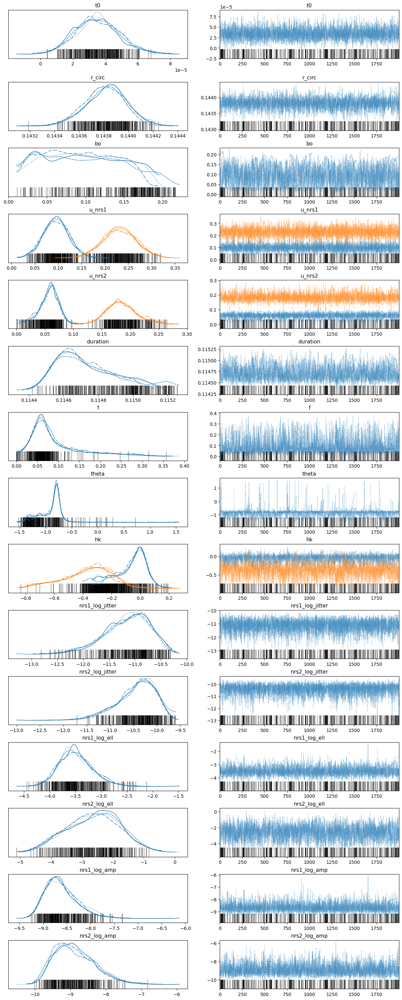

In [9]:
az.plot_trace(
    inf_data_obl,
    var_names=['t0','r_circ', 'bo', 'u_nrs1','u_nrs2', 'duration', 'f', 'theta', 'hk',
                                'nrs1_log_jitter', 'nrs2_log_jitter', 
                                "nrs1_log_ell", "nrs2_log_ell","nrs1_log_amp","nrs2_log_amp"],
    backend_kwargs={"constrained_layout": True},
);

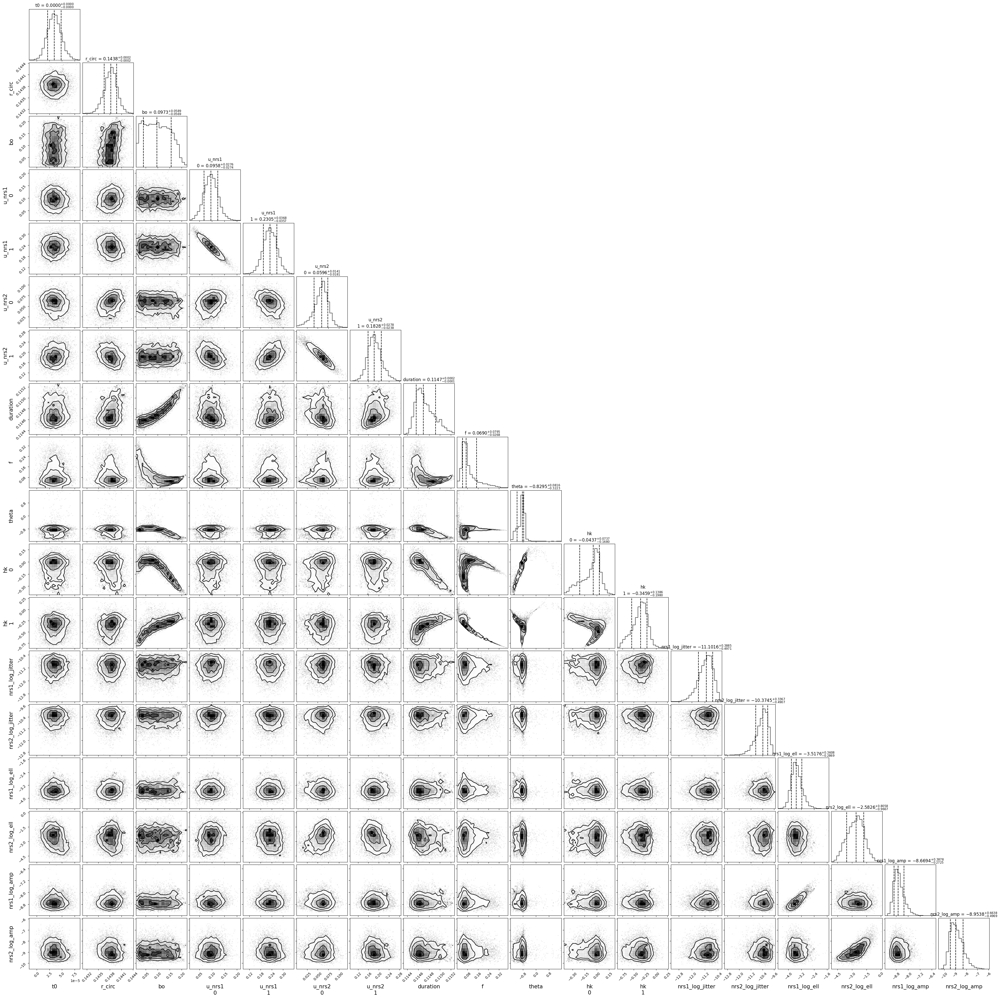

In [10]:
import corner
corner.corner(
    inf_data_obl,
    var_names=['t0','r_circ', 'bo', 'u_nrs1','u_nrs2', 'duration', 'f', 'theta', 'hk',
                                'nrs1_log_jitter', 'nrs2_log_jitter', 
                                "nrs1_log_ell", "nrs2_log_ell","nrs1_log_amp","nrs2_log_amp"],
    show_titles=True,
    quantiles=[0.16, 0.5, 0.84],
    title_kwargs={"fontsize": 12},
    label_kwargs={"fontsize": 15},
    title_fmt=".4f",
);

Text(0.5, 0.98, 'Oblate GP model')

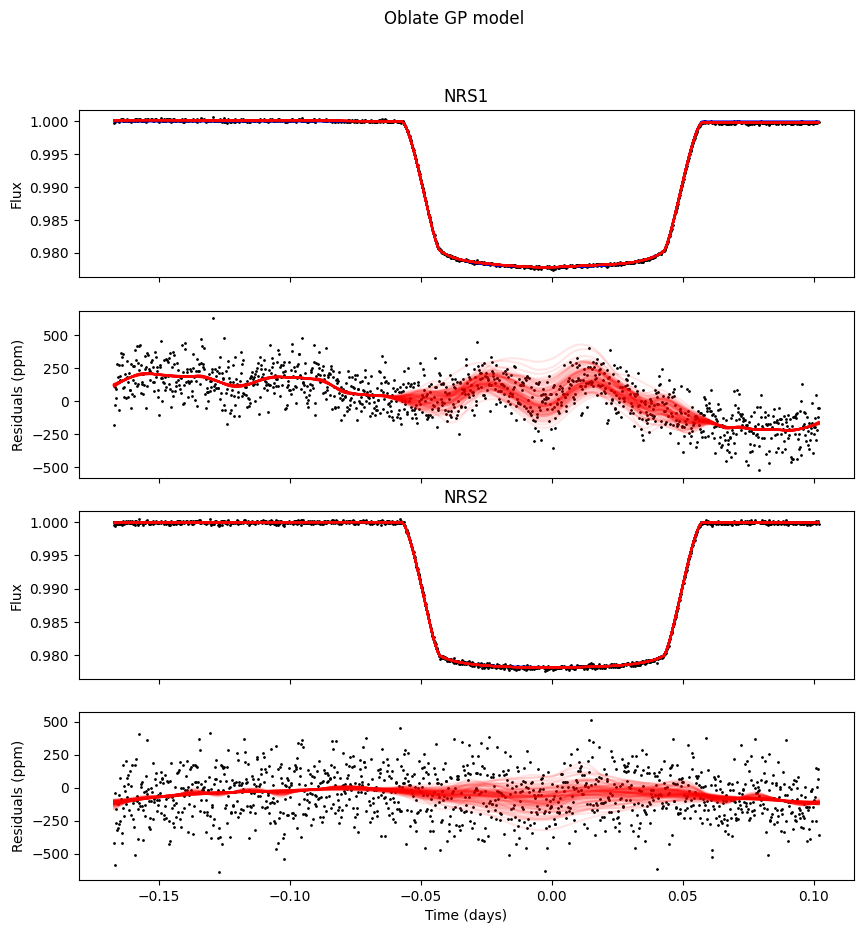

In [11]:
fig, (ax1, ax3, ax2, ax4) = plt.subplots(4,1,figsize=(10,10), sharex=True)

nrs1_mean_lc = inf_data_obl.posterior["nrs1_light_curve"].mean(axis=(0,1)).to_numpy()
nrs1_mean_gp = inf_data_obl.posterior["nrs1_gp"].mean(axis=(0,1)).to_numpy()

nrs2_mean_lc = inf_data_obl.posterior["nrs2_light_curve"].mean(axis=(0,1)).to_numpy()
nrs2_mean_gp = inf_data_obl.posterior["nrs2_gp"].mean(axis=(0,1)).to_numpy()

ax1.scatter(t,nsr_1_f,c='k',s=1)
ax2.scatter(t,nrs_2_f,c='k',s=1)
ax1.plot(t,nrs1_mean_lc,c='b', label="mean oblate transit model")
ax1.plot(t,nrs1_mean_gp+nrs1_mean_lc,c='r', label="GP")
ax1.set_title("NRS1")
ax2.plot(t,nrs2_mean_lc,c='b', label="mean oblate transit model")
ax2.plot(t,nrs2_mean_gp+nrs2_mean_lc,c='r', label="GP")
ax2.set_title("NRS2")
ax1.set_ylabel("Flux")
ax2.set_ylabel("Flux")
#plot residuals
ax3.scatter(t,1e6*(nsr_1_f-nrs1_mean_lc),c='k',s=1)
ax4.scatter(t,1e6*(nrs_2_f-nrs2_mean_lc),c='k',s=1)
#ax3.plot(t,1e6*nrs1_mean_gp,c='r')
#ax4.plot(t,1e6*nrs2_mean_gp,c='r')
ax3.set_ylabel("Residuals (ppm)")
ax4.set_ylabel("Residuals (ppm)")
ax4.set_xlabel("Time (days)")

#plot random draws from the posterior
np.random.seed(1)
inds = np.random.choice(inf_data_obl.posterior.chain.size*inf_data_obl.posterior.draw.size, 100)
inds_2d = np.unravel_index(inds, (inf_data_obl.posterior.chain.size, inf_data_obl.posterior.draw.size))
for i, j in zip(*inds_2d):
    ax1.plot(t,inf_data_obl.posterior['nrs1_light_curve'].to_numpy()[i,j]+inf_data_obl.posterior["nrs1_gp"].to_numpy()[i,j],c='r', alpha=0.1)
    ax2.plot(t,inf_data_obl.posterior['nrs2_light_curve'].to_numpy()[i,j]+inf_data_obl.posterior["nrs2_gp"].to_numpy()[i,j],c='r', alpha=0.1)
    
    ax3.plot(t,1e6*(inf_data_obl.posterior["nrs1_gp"].to_numpy()[i,j]),c='r', alpha=0.1)
    ax4.plot(t,1e6*(inf_data_obl.posterior["nrs2_gp"].to_numpy()[i,j]),c='r', alpha=0.1)
plt.suptitle("Oblate GP model")

Text(0.5, 0.98, 'Oblate GP model')

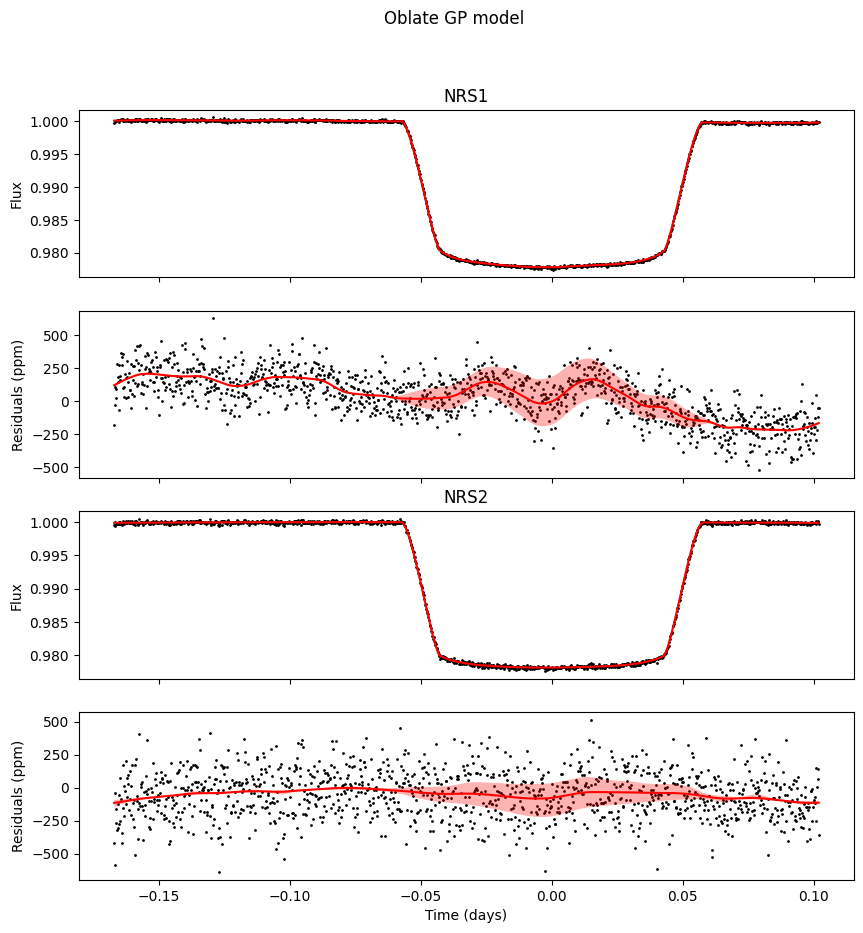

In [12]:
fig, (ax1, ax3, ax2, ax4) = plt.subplots(4,1,figsize=(10,10), sharex=True)

nrs1_mean_lc = inf_data_obl.posterior["nrs1_light_curve"].mean(axis=(0,1)).to_numpy()
nrs1_mean_gp = inf_data_obl.posterior["nrs1_gp"].mean(axis=(0,1)).to_numpy()

nrs2_mean_lc = inf_data_obl.posterior["nrs2_light_curve"].mean(axis=(0,1)).to_numpy()
nrs2_mean_gp = inf_data_obl.posterior["nrs2_gp"].mean(axis=(0,1)).to_numpy()

ax1.scatter(t,nsr_1_f,c='k',s=1)
ax2.scatter(t,nrs_2_f,c='k',s=1)
#ax1.plot(t,nrs1_mean_lc,c='b', label="mean oblate transit model")
ax1.plot(t,nrs1_mean_gp+nrs1_mean_lc,c='r', label="GP")
ax1.set_title("NRS1")
#ax2.plot(t,nrs2_mean_lc,c='b', label="mean oblate transit model")
ax2.plot(t,nrs2_mean_gp+nrs2_mean_lc,c='r', label="GP")
ax2.set_title("NRS2")
ax1.set_ylabel("Flux")
ax2.set_ylabel("Flux")
#plot residuals
ax3.scatter(t,1e6*(nsr_1_f-nrs1_mean_lc),c='k',s=1)
ax4.scatter(t,1e6*(nrs_2_f-nrs2_mean_lc),c='k',s=1)
#ax3.plot(t,1e6*nrs1_mean_gp,c='r')
#ax4.plot(t,1e6*nrs2_mean_gp,c='r')
ax3.set_ylabel("Residuals (ppm)")
ax4.set_ylabel("Residuals (ppm)")
ax4.set_xlabel("Time (days)")

nrs1_upper_gp, nrs1_lower_gp = np.percentile(inf_data_obl.posterior["nrs1_gp"].to_numpy(), (5,95), axis=(0,1))
nrs2_upper_gp, nrs2_lower_gp = np.percentile(inf_data_obl.posterior["nrs2_gp"].to_numpy(), (5,95), axis=(0,1))

nrs1_upper_transit, nrs1_lower_transit = np.percentile(inf_data_obl.posterior['nrs1_light_curve'].to_numpy()+inf_data_obl.posterior["nrs1_gp"].to_numpy(), (5, 95), axis=(0,1))
nrs2_upper_transit, nrs2_lower_transit = np.percentile(inf_data_obl.posterior['nrs2_light_curve'].to_numpy()+inf_data_obl.posterior["nrs2_gp"].to_numpy(), (5, 95), axis=(0,1))

ax1.fill_between(t,nrs1_lower_transit, nrs1_upper_transit,color='r', alpha=0.3, edgecolor='none')
ax2.fill_between(t,nrs2_lower_transit,nrs2_upper_transit,color='r', alpha=0.3,edgecolor='none')

ax3.plot(t, 1e6*nrs1_mean_gp,c='r')
ax4.plot(t, 1e6*nrs2_mean_gp,c='r')

ax3.fill_between(t,1e6*(nrs1_lower_gp), 1e6*nrs1_upper_gp,color='r', alpha=0.3, edgecolor='none')
ax4.fill_between(t,1e6*(nrs2_lower_gp), 1e6*nrs2_upper_gp,color='r', alpha=0.3, edgecolor='none')
plt.suptitle("Oblate GP model")

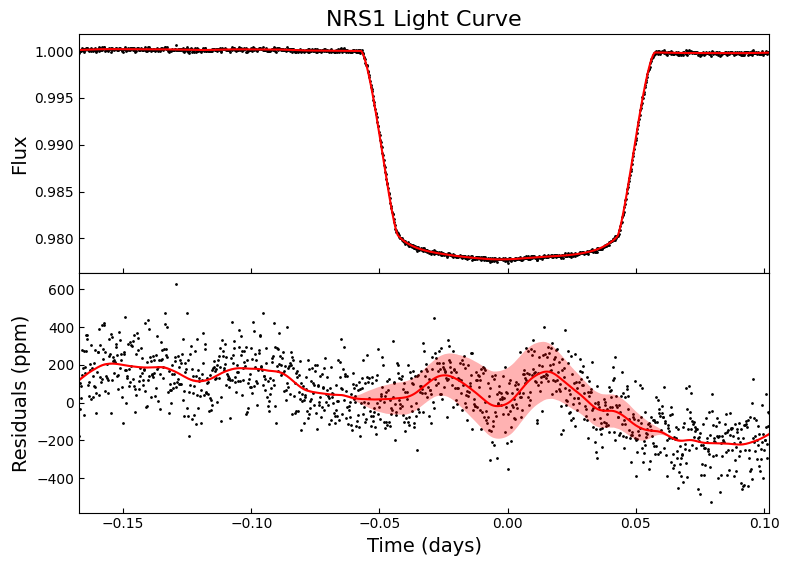

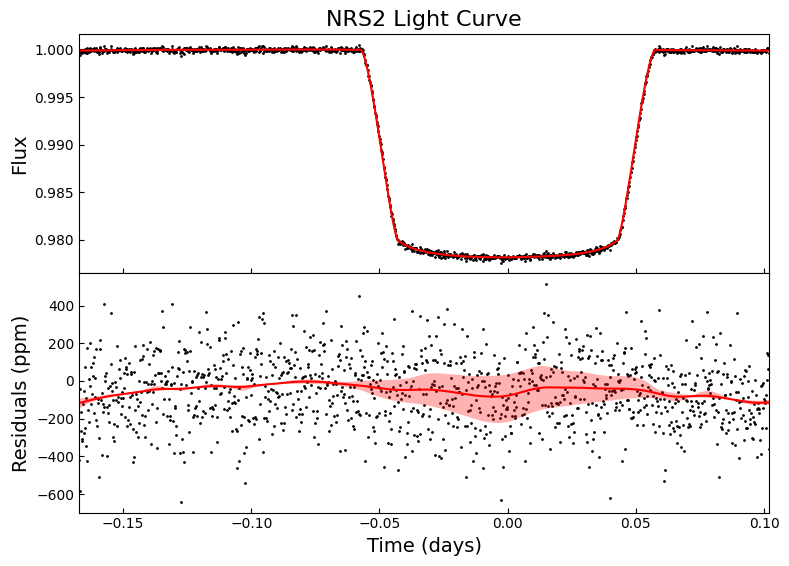

In [13]:
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
# Calculate means and percentiles
nrs1_mean_gp = inf_data_obl.posterior["nrs1_gp"].mean(axis=(0,1)).to_numpy()
nrs2_mean_gp = inf_data_obl.posterior["nrs2_gp"].mean(axis=(0,1)).to_numpy()

nrs1_upper_gp, nrs1_lower_gp = np.percentile(inf_data_obl.posterior["nrs1_gp"].to_numpy(), (5,95), axis=(0,1))
nrs2_upper_gp, nrs2_lower_gp = np.percentile(inf_data_obl.posterior["nrs2_gp"].to_numpy(), (5,95), axis=(0,1))

nrs1_upper_transit, nrs1_lower_transit = np.percentile(inf_data_obl.posterior['nrs1_light_curve'].to_numpy()+inf_data_obl.posterior["nrs1_gp"].to_numpy(), (5, 95), axis=(0,1))
nrs2_upper_transit, nrs2_lower_transit = np.percentile(inf_data_obl.posterior['nrs2_light_curve'].to_numpy()+inf_data_obl.posterior["nrs2_gp"].to_numpy(), (5, 95), axis=(0,1))

# Plot for nrs1
fig, (ax1, ax3) = plt.subplots(2, 1, figsize=(8, 6), sharex=True)
ax1.scatter(t, nsr_1_f, c='k', s=1)
ax1.plot(t, nrs1_mean_gp + nrs1_mean_lc, c='r', label="GP")
ax1.fill_between(t, nrs1_lower_transit, nrs1_upper_transit, color='r', alpha=0.3, edgecolor='none')
ax1.set_title("NRS1 Light Curve", fontsize=16)
ax1.set_ylabel("Flux", fontsize=14)
ax1.set_xlim(t.min(), t.max())


ax3.scatter(t, 1e6 * (nsr_1_f - nrs1_mean_lc), c='k', s=1)
ax3.plot(t, 1e6 * nrs1_mean_gp, c='r')
ax3.fill_between(t, 1e6 * nrs1_lower_gp, 1e6 * nrs1_upper_gp, color='r', alpha=0.3, edgecolor='none')
ax3.set_ylabel("Residuals (ppm)", fontsize=14)
ax3.set_xlabel("Time (days)", fontsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.subplots_adjust(hspace=0)
ax1.set_rasterization_zorder(0)
ax3.set_rasterization_zorder(0)
plt.savefig(paths.figures/"nrs1_oblate_GP.pdf",dpi=300)
plt.show()

# Plot for nrs2
fig, (ax2, ax4) = plt.subplots(2, 1, figsize=(8, 6), sharex=True)

ax2.scatter(t, nrs_2_f, c='k', s=1)
ax2.plot(t, nrs2_mean_gp + nrs2_mean_lc, c='r', label="GP")
ax2.fill_between(t, nrs2_lower_transit, nrs2_upper_transit, color='r', alpha=0.3, edgecolor='none')
ax2.set_title("NRS2 Light Curve", fontsize=16)
ax2.set_ylabel("Flux", fontsize=14)
ax2.set_xlim(t.min(), t.max())

ax4.scatter(t, 1e6 * (nrs_2_f - nrs2_mean_lc), c='k', s=1)
ax4.plot(t, 1e6 * nrs2_mean_gp, c='r')
ax4.fill_between(t, 1e6 * nrs2_lower_gp, 1e6 * nrs2_upper_gp, color='r', alpha=0.3, edgecolor='none')
ax4.set_ylabel("Residuals (ppm)", fontsize=14)
ax4.set_xlabel("Time (days)", fontsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.subplots_adjust(hspace=0)
ax2.set_rasterization_zorder(0)
ax4.set_rasterization_zorder(0)
plt.savefig(paths.figures/"nrs2_oblate_GP.pdf")
plt.show()

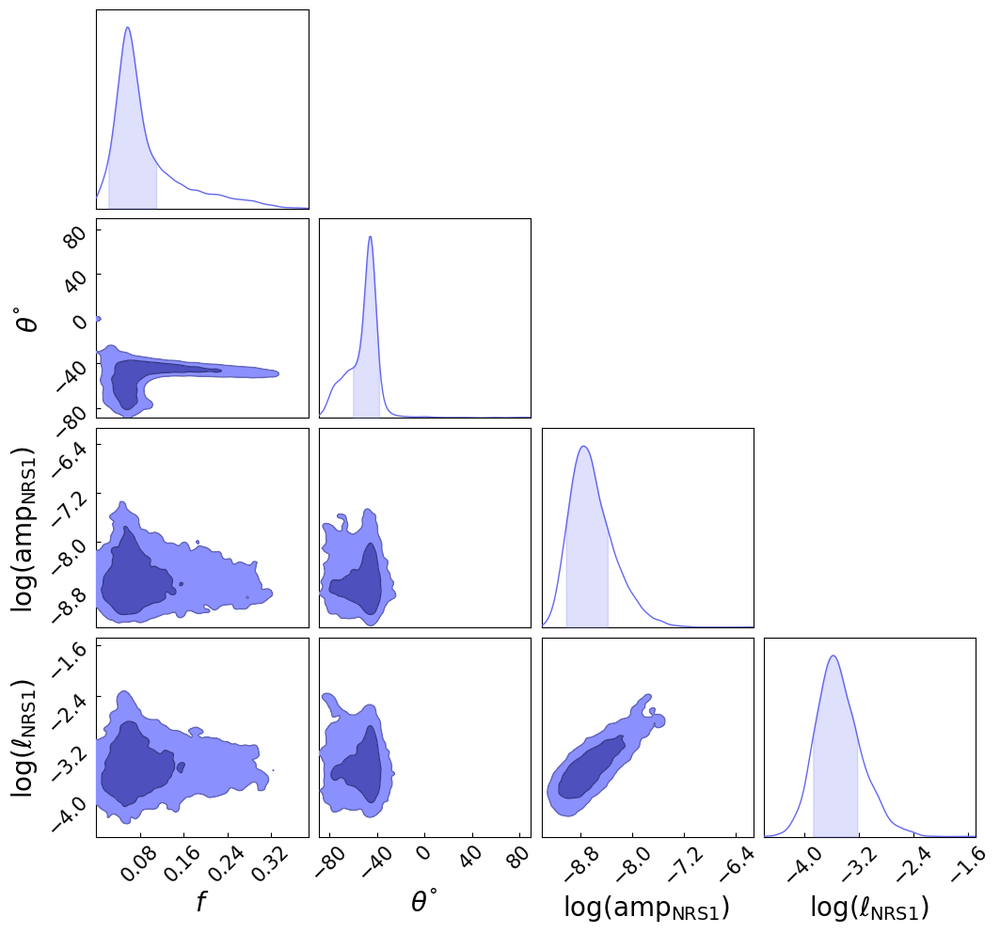

In [62]:
from chainconsumer import ChainConsumer, Chain, PlotConfig, ChainConfig

# Assuming inf_data_obl is already defined
# Extract samples
f_samples = np.concatenate(inf_data_obl.posterior.f.to_numpy(), axis=0).T
theta_samples = np.degrees(np.concatenate(inf_data_obl.posterior.theta.to_numpy(), axis=0))
nrs1_log_amp_samples = np.concatenate(inf_data_obl.posterior.nrs1_log_amp.to_numpy(), axis=0)
nrs1_log_ell_samples = np.concatenate(inf_data_obl.posterior.nrs1_log_ell.to_numpy(), axis=0)
nrs2_log_amp_samples = np.concatenate(inf_data_obl.posterior.nrs2_log_amp.to_numpy(), axis=0)
nrs2_log_ell_samples = np.concatenate(inf_data_obl.posterior.nrs2_log_ell.to_numpy(), axis=0)

# Create DataFrame and rename columns
samples_df = pd.DataFrame(np.array([f_samples, theta_samples, nrs1_log_amp_samples, nrs1_log_ell_samples]).T, columns=[r'$f$', r'$\theta^\degree$', r'$\log(\mathrm{amp}_{\mathrm{NRS1}})$', r'$\log(\ell_{\mathrm{NRS1}})$'])

# Create the chain from the DataFrame
chain = Chain(samples=samples_df, name="Oblate GP MCMC", color="indigo")

cc = ChainConsumer()
cc.set_plot_config(PlotConfig(usetex=False, label_font_size=20, tick_font_size=15, summarise=False))
fig = cc.add_chain(chain).plotter.plot()
plt.savefig(paths.figures/"corner_oblate_GP_with_GPhyp.pdf",dpi=300)

In [20]:
f_samples.mean(), f_samples.std()

(0.09117118034158282, 0.06458701676652003)

In [25]:
f_pct = np.percentile(inf_data_obl.posterior['f'].to_numpy(), (16, 50, 84), axis=(0,1))
theta_pct = np.percentile(inf_data_obl.posterior['theta'].to_numpy(), (16, 50, 84), axis=(0,1))
r_circ_pct = np.percentile(inf_data_obl.posterior['r_circ'].to_numpy(), (16, 50, 84), axis=(0,1))
r_eq_pct = r_circ_pct / np.sqrt(1 - f_pct)

In [33]:
from astropy.constants import G, R_sun, M_sun, R_jup, M_jup
from astropy import units as u

def calc_rot_period(r_eq, m_p, f):
    """ Compute the rotation period of a planet given r_eq in jupiter radii, m_p in jupiter masses, and f the oblateness factor.

    Args:
        r_eq (Quantity): planet equatorial radius
        m_p (Quantity): planet mass (jupiter masses)
        f (float): oblateness factor (dimensionless)

    Returns:
        Quantity: rotation period
    """
    return 2 * np.pi * np.sqrt((r_eq)**3 / (2* G * (m_p)) * (1/f))

mean_rot_period = calc_rot_period(r_eq_pct[1]*(0.67*R_sun), 0.096*M_jup, f_pct[1])

In [44]:
r_eq = inf_data_obl.posterior['r_circ'].to_numpy().flatten() / np.sqrt(1 - inf_data_obl.posterior['f'].to_numpy().flatten())

In [47]:
m_p = np.random.normal(0.12, 0.01, r_eq.shape) * M_jup
r_star = np.random.normal(0.67, 0.02, r_eq.shape) * R_sun

rot_period = calc_rot_period(r_eq*r_star, m_p, inf_data_obl.posterior['f'].to_numpy().flatten())

(0.0, 100.0)

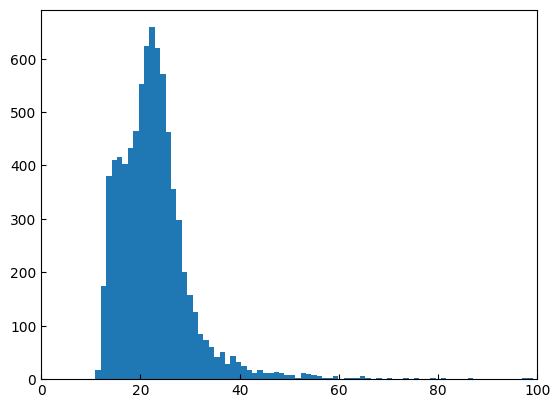

In [57]:
plt.hist(rot_period.to(u.hour).value,bins=500)
plt.xlim(0, 100)

In [58]:
np.percentile(rot_period.to(u.hour), (5, 50, 95))

<Quantity [13.72954397, 22.01046382, 36.22355727] h>

In [54]:
mean_rot_period.to(u.day)

<Quantity 1.02799295 d>

In [38]:
rot_period = calc_rot_period(r_eq_pct*(0.67*R_sun), 0.096*M_jup, f_pct)

In [39]:
rot_period.to(u.day)

<Quantity [1.28409914, 1.02799295, 0.7505493 ] d>

In [43]:
inf_data_obl.posterior['r_circ'].to_numpy()

<xarray.DataArray 'r_circ' ()> Size: 8B
array(0.14382456)